In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

#CarND-Advanced Lane Lines
# Initial functions used throughout project. 

# Edit this function to create your own pipeline.
def apply_thresholds(img, s_thresh=(170, 255), sx_thresh=(20, 100), l_thresh=(100, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    sl_binary = np.zeros_like(s_channel)
    sl_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1]) & (l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, sl_binary))
    return color_binary

def combine_channels(img):
    channel1 = img[:,:,1]
    channel2 = img[:,:,2]
    combined = np.zeros_like(channel1)
    combined[(channel1 == 1) | (channel2 == 1)] = 1
    return combined

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, 1)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [4]:
# Computing the camera calibration matrix and distortion coefficients given a set of chessboard images
# Code in this cell derived from CarND-Camera-Calibration project in course examples
# https://github.com/udacity/CarND-Camera-Calibration

import glob
chess_x = 9
chess_y = 6
draw_outputs = False

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((chess_y*chess_x,3), np.float32)
objp[:,:2] = np.mgrid[0:chess_x, 0:chess_y].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/cal*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (chess_x,chess_y), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        if draw_outputs == True:
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (chess_x,chess_y), corners, ret)
            #write_name = 'camera_cal/output/corners_found'+str(idx)+'.jpg'
            #cv2.imwrite(write_name, img)
            cv2.imshow('img', img)
            cv2.waitKey(500)

cv2.destroyAllWindows()


# Apply a distortion correction to raw images.
# Use color transforms, gradients, etc., to create a thresholded binary image.
# Apply a perspective transform to rectify binary image ("birds-eye view").


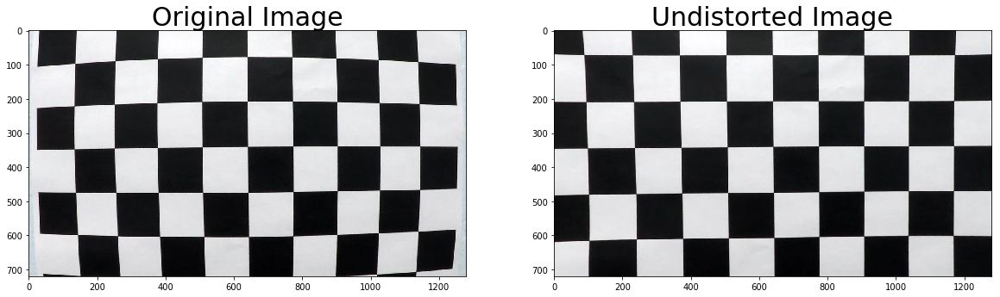

In [5]:
# Test undistortion on a checkboard image

import pickle
%matplotlib inline

img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/undist_calibration1.jpg',dst)

#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

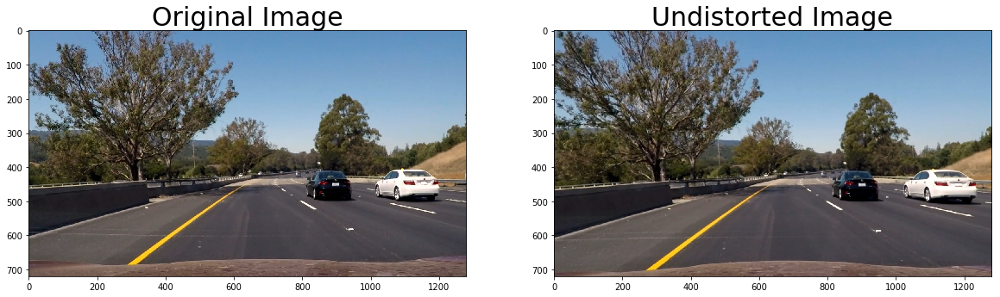

In [6]:
# Testing distortion on test image
%matplotlib inline

img = cv2.imread('test_images/test6.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('output_images/undist_test6.jpg',dst)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)


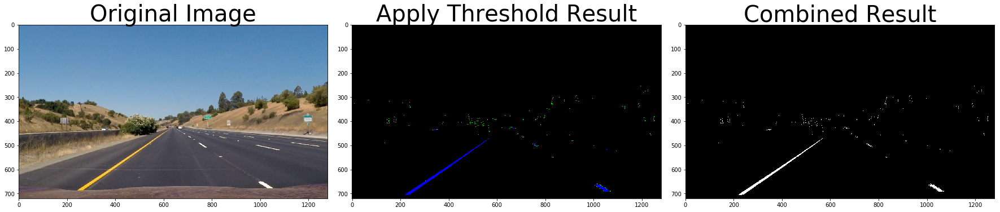

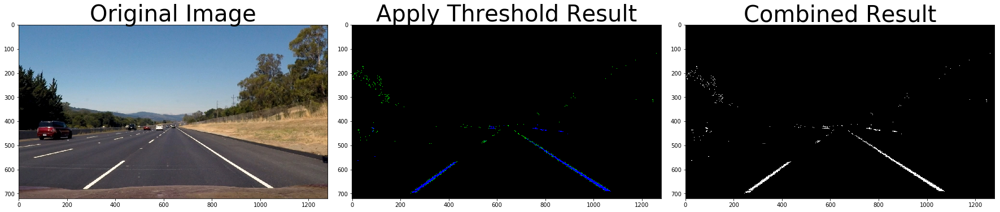

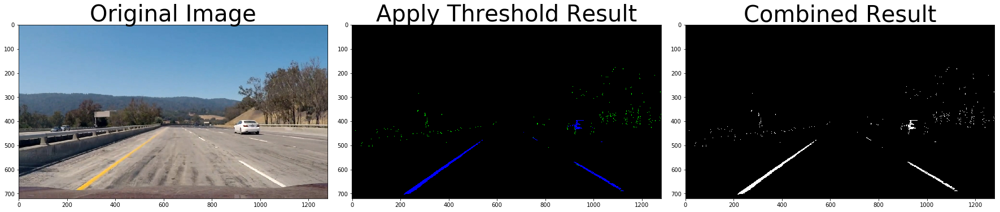

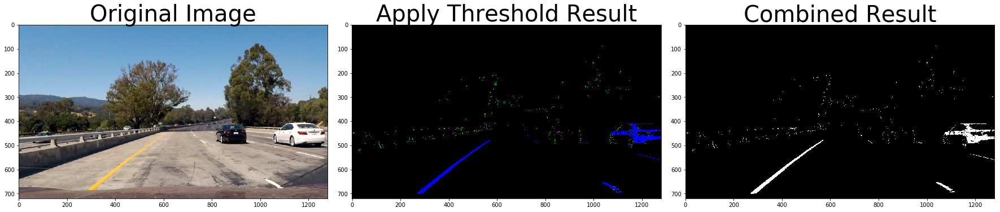

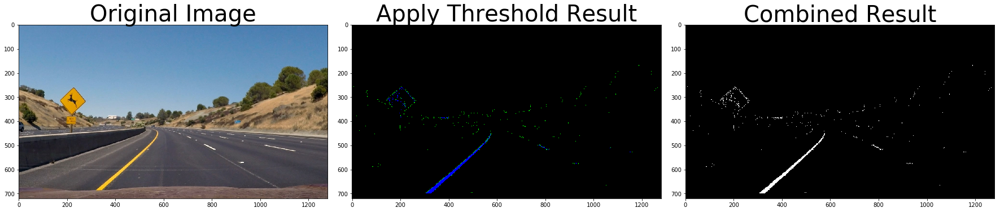

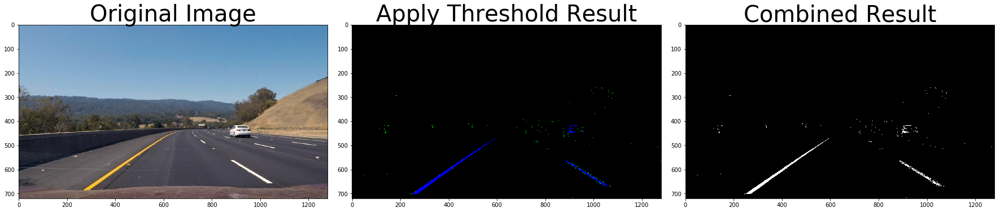

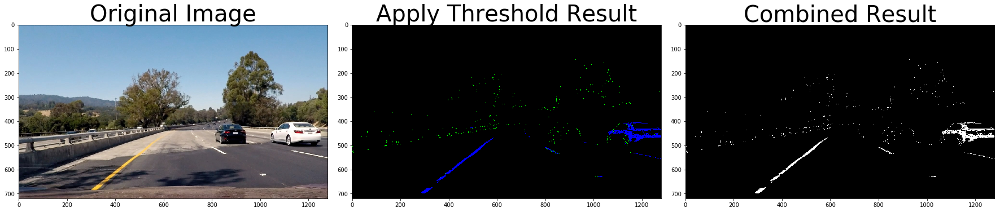

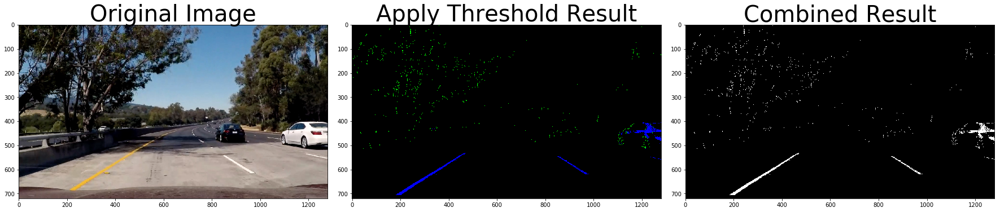

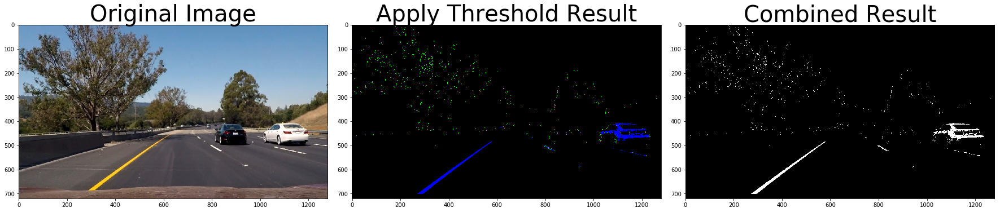

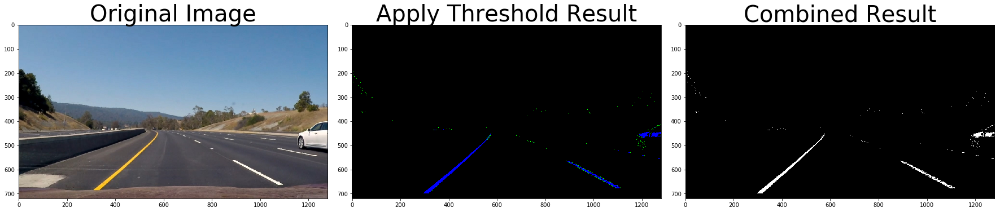

In [7]:

# Step through the list and apply our pipeline function. 
# This cell is for trying out different thresholds
import os
s_thresh=(170, 255) 
sx_thresh=(80, 100)
l_thresh=(120, 255)
transformed = []
undist_images = []
for filename in os.listdir('test_images'):

    image = mpimg.imread('test_images/' + filename)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    undist_images.append(np.copy(undist))
    result = apply_thresholds(undist, s_thresh, sx_thresh, l_thresh)
    combined = combine_channels(result)

    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result)
    ax2.set_title('Apply Threshold Result', fontsize=40)
    
    ax3.imshow(combined, cmap='gray')
    ax3.set_title('Combined Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
       
    transformed.append(combined)
    

Source
[[  590.           450.        ]
 [  193.33332825   700.        ]
 [ 1131.66662598   700.        ]
 [  690.           450.        ]]
Dest
[[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]
Vertices
[[[1088   14]
  [1088  712]
  [ 832  712]
  [ 640   72]
  [ 448  712]
  [ 192  712]
  [ 192   14]]]


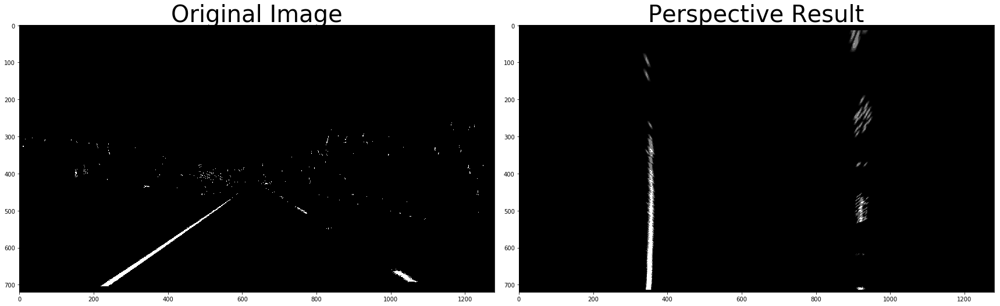

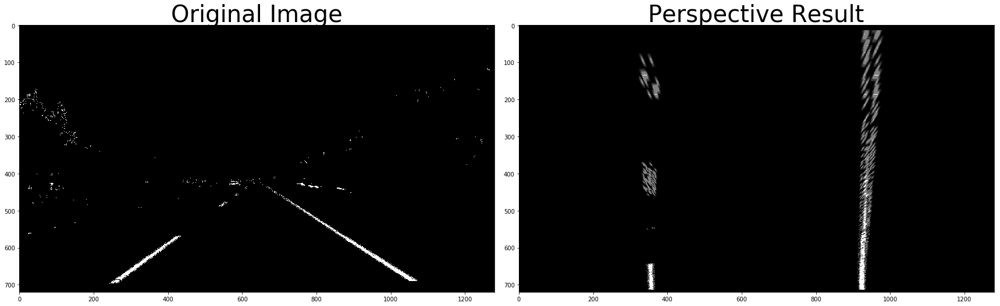

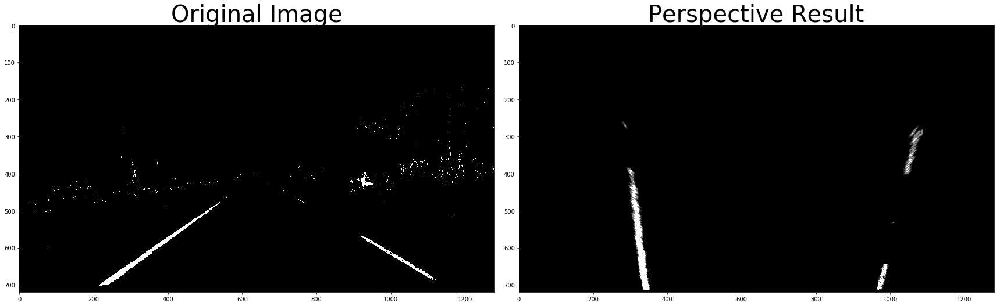

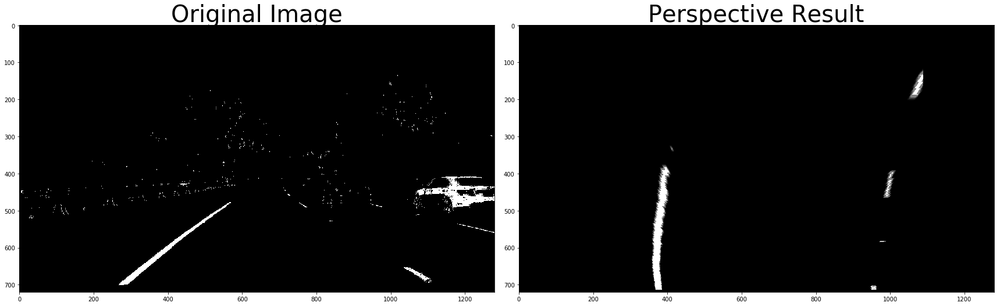

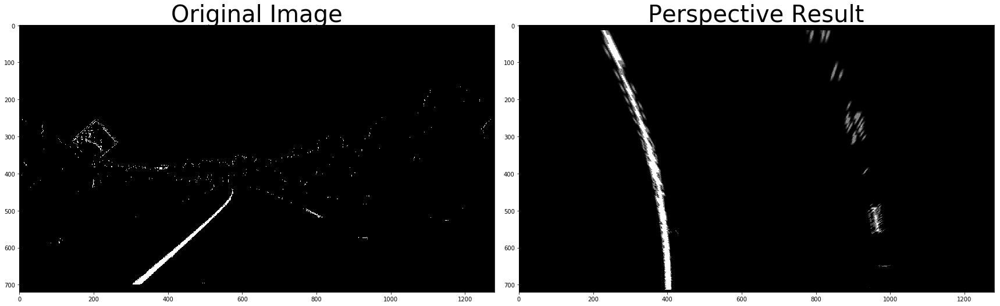

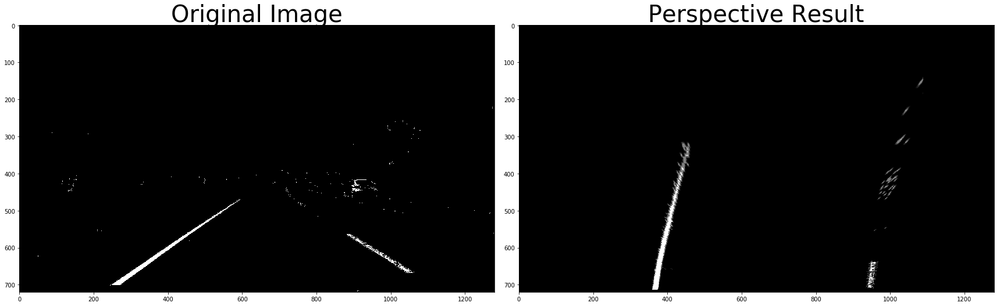

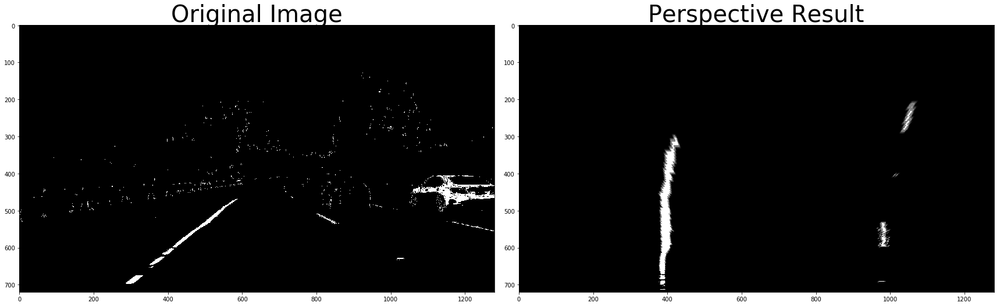

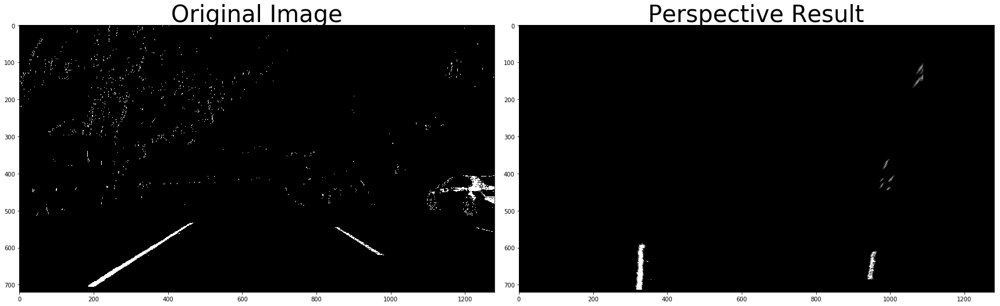

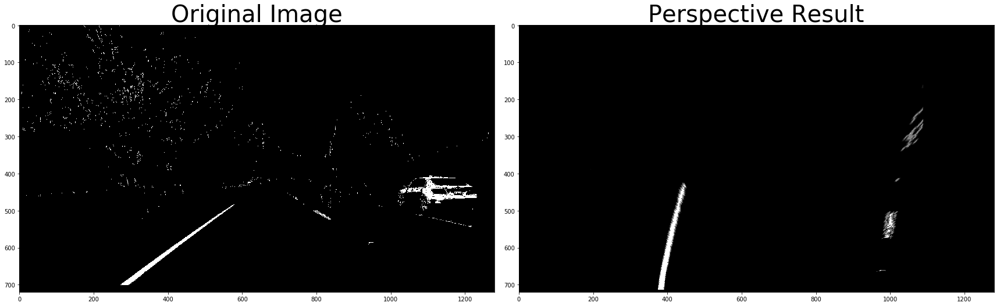

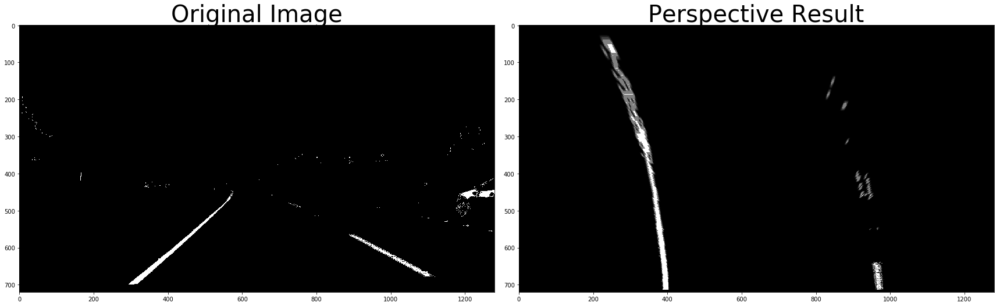

In [12]:
# Perspective transform and mask

image = transformed[0]
vert_images = []

def src_dst_matrices(image):
    img_size = (image.shape[1], image.shape[0])
    src = np.float32(
        [[(img_size[0] / 2) - 50, img_size[1] / 2 + 90],
        [((img_size[0] / 6) - 20), img_size[1] -20],
        [(img_size[0] * 5 / 6) + 65, img_size[1] -20],
        [(img_size[0] / 2 + 50), img_size[1] / 2 + 90]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
      
    print('Source')
    print(src)
    print('Dest')
    print(dst)
    return src, dst

def warper(image, src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    result = cv2.warpPerspective(image, M, img_size)
    return result

src, dst = src_dst_matrices(image)

# Generates the vertices array used for a region of interest on the warped perspective image
def get_vertices(image):
    img_size = (image.shape[1], image.shape[0])
    y_max = img_size[1]
    x_max = img_size[0]
    # Create a rough "pq" shape on the image as a region of interest
    vertices = np.array(
        [[((int)(x_max * 0.85), (int)(y_max * 0.02)),
         ((int)(x_max * 0.85), (int)(y_max * 0.99)),
         ((int)(x_max * 0.65), (int)(y_max * 0.99)),
         ((int)(x_max * 0.50), (int)(y_max * 0.10)),
         ((int)(x_max * 0.35), (int)(y_max * 0.99)),
         ((int)(x_max * 0.15), (int)(y_max * 0.99)),
         ((int)(x_max * 0.15), (int)(y_max * 0.02))]], dtype=np.int32)

    print('Vertices')
    print(vertices)
    return vertices

vertices = get_vertices(image)

# Testing on original images.
#for filename in os.listdir('test_images'):
#    image = mpimg.imread('test_images/' + filename)
#    image = np.copy(image)
#    cv2.polylines(image, np.int32([src]),3, 255)
#    result = warper(image, src, dst)
#    cv2.polylines(result, np.int32([dst]),3, 255)

    # Plot the result
#    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#    f.tight_layout()
#    ax1.imshow(image)
#    ax1.set_title('Original Image', fontsize=40)

#    ax2.imshow(result, cmap='gray')
#    ax2.set_title('Perspective Result', fontsize=40)
    
# Real images
for image in transformed:  
    result = warper(image, src, dst)
    result = region_of_interest(result, vertices) 
    #cv2.polylines(result, np.int32([vertices]),3, 255)
    vert_images.append(result)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image, cmap='gray')
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Perspective Result', fontsize=40)
    

In [13]:
def full_pipeline(image, draw_extra=False):
    
    # Undistort the image
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    # Apply color thresholds
    result = apply_thresholds(undist, s_thresh, sx_thresh, l_thresh)
    # Combine them
    combined = combine_channels(result)
    # Perspective warp
    warped = warper(combined, src, dst)
    # ROI filter on warped image
    roi = region_of_interest(warped, vertices) 
    # Histogram to find lanes, draw on image
    return add_histo(roi, undist, draw_extra)

def add_histo(binary_warped, undist, draw_extra=False):
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    #if (draw_extra):
    #plt.plot(histogram)
    #plt.show()

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print('Left', leftx_base, ' Right', rightx_base )

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 120
    # Set minimum number of pixels found to recenter window
    minpix = 20
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit = np.polyfit(lefty, leftx, 2)
    new_leftx = leftx[0]
    right_fit = np.polyfit(righty, rightx, 2)
    new_rightx = rightx[0]
    
    # Sanity checks - width
    width_limit_in_px = 100
    width_in_px = new_rightx - new_leftx
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    avg_curverad = int(left_curverad + right_curverad / 2)

   
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    width_in_m = binary_warped.shape[1] * xm_per_pix / 2
    lane_centre = (new_leftx + new_rightx) * xm_per_pix / 2 - width_in_m
    centre_text = 'Vehicle is '
    if (lane_centre >= 0):
        centre_text = centre_text + '{0:.2f}m right of center'.format(lane_centre)
    else:
        centre_text = centre_text + '{0:.2f}m left of center'.format(abs(lane_centre))
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    Minv = cv2.getPerspectiveTransform(dst,src)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image, showing extra processing data if desired
    if (draw_extra):
        cv2.fillPoly(color_warp, np.int_([pts]), (0,50, 0))
        color_warp[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        color_warp[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(undist, 0.3, newwarp, 0.8, 0)
        result = cv2.addWeighted(result, 0.7, color_warp, 1, 0)
    else:
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
        result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
        
    #Lines to draw image seen in writeup
    #color_warp = np.dstack((binary_warped, binary_warped, binary_warped)).astype(np.uint8)*255
    #color_warp[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    #color_warp[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    #cv2.polylines(color_warp,pts_left.astype(np.int32),0,(255,255,0),3)
    #cv2.polylines(color_warp,pts_right.astype(np.int32),0,(255,255,0),3)
    #result = color_warp #cv2.addWeighted(warp_result, 1, color_warp, 1, 0)
    
    # Write some Text
    font = cv2.FONT_HERSHEY_SIMPLEX
    
    curve_text = 'Radius of Curvature = {0:.0f}(m)'.format(avg_curverad)
    cv2.putText(result,curve_text,(10,30), font, 1,(255,255,255),2)
    cv2.putText(result,centre_text,(10,60), font, 1,(255,255,255),2)
    return result


class MyVideoProcessor(object):

    def __init__(self):
        self.draw_extra = False
        
    def pipeline(self, image):
        # your lane detection pipeline
        result = full_pipeline(image, self.draw_extra)     
        return result
    

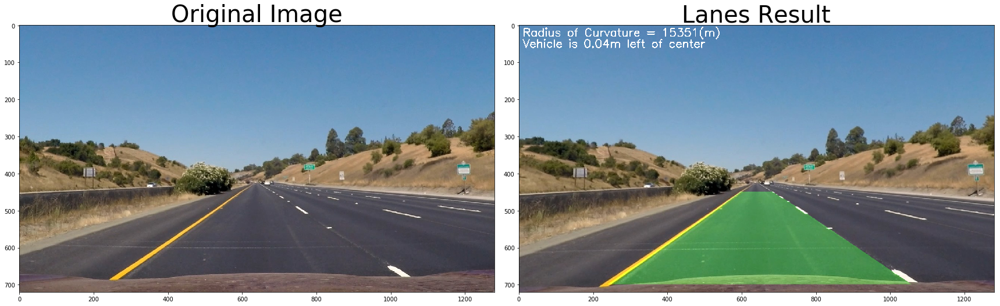

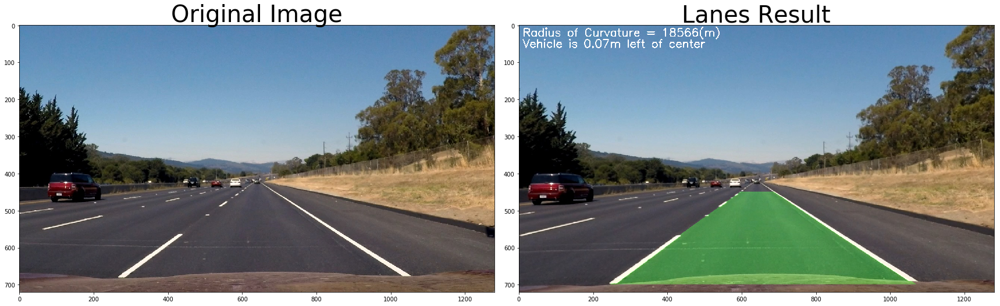

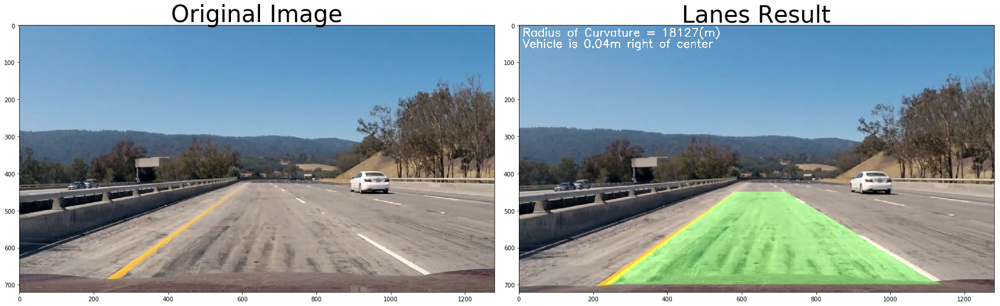

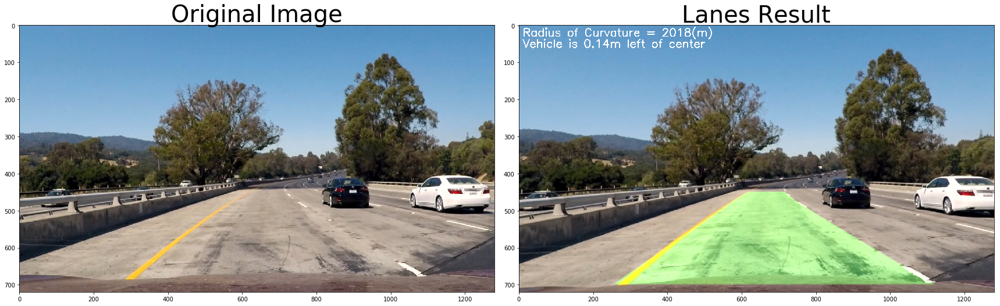

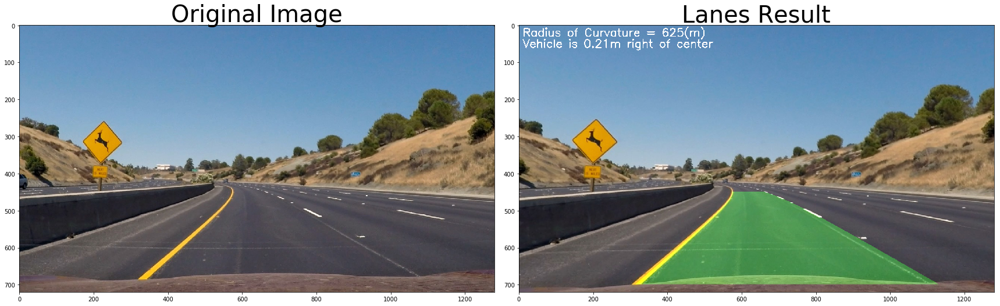

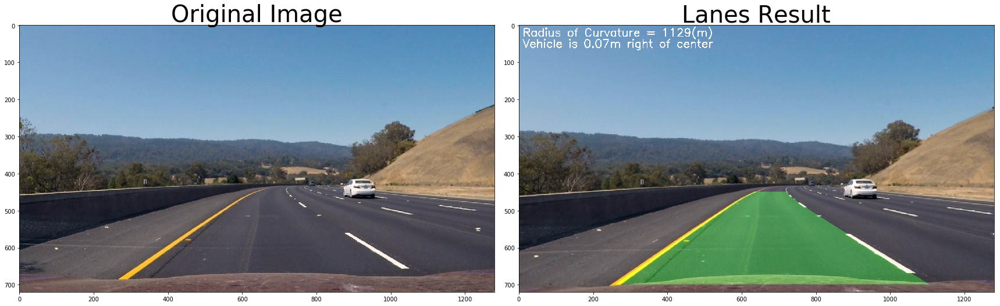

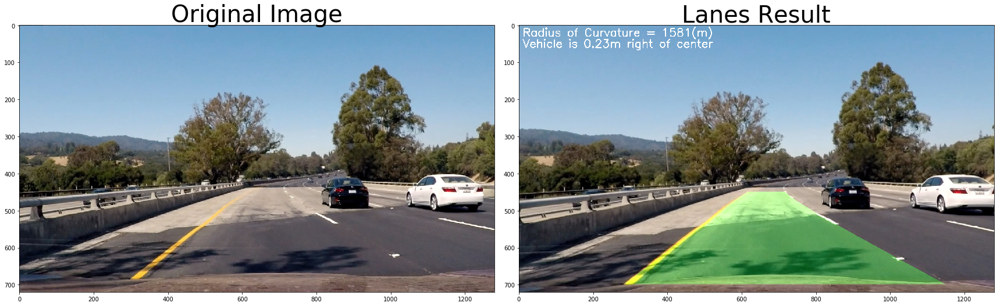

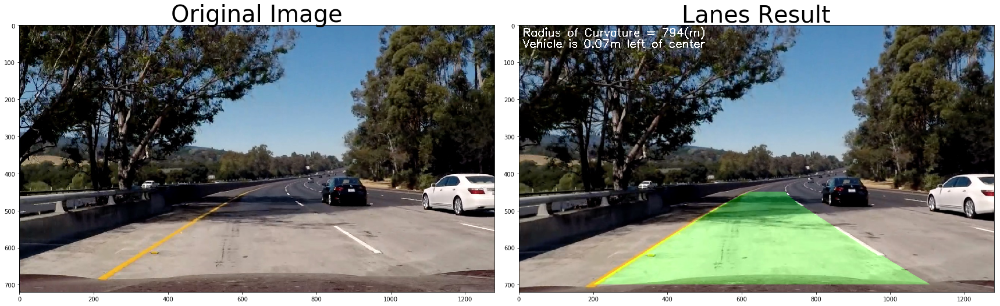

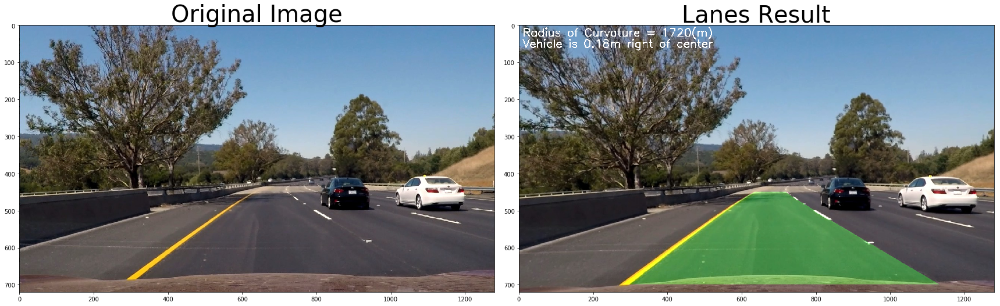

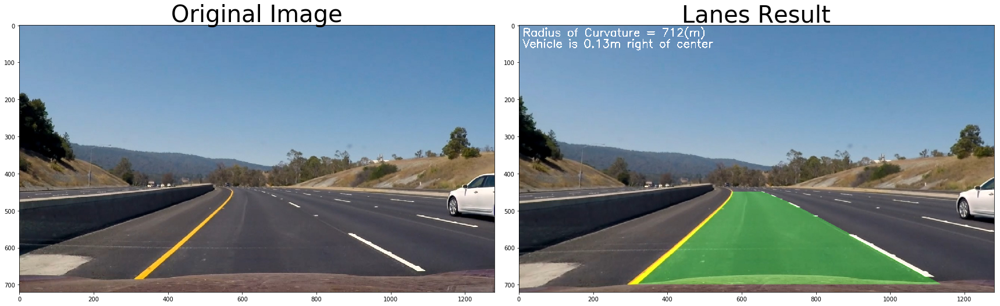

In [14]:
# Testing the pipeline on files
my_file_processor = MyVideoProcessor()
s_thresh=(100, 255)
sx_thresh=(40, 255)
l_thresh=(100, 255)

for filename in os.listdir('test_images'):
    image = mpimg.imread('test_images/' + filename)
    my_file_processor.draw_extra = False
    result = my_file_processor.pipeline(image)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result)
    ax2.set_title('Lanes Result', fontsize=40)
    
    #dst2 = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    #cv2.imwrite('output_images/lanes/' + filename, dst2)

In [15]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [16]:
my_video_processor = MyVideoProcessor()

# Here we test the first video
lanes_output = 'output_videos/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
lanes_clip = clip1.fl_image(my_video_processor.pipeline) #NOTE: this function expects color images!!
%time lanes_clip.write_videofile(lanes_output, audio=False)

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing video output_videos/project_video.mp4


100%|█████████████████████████████████████▉| 1260/1261 [05:19<00:00,  3.94it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video.mp4 

Wall time: 5min 20s


In [18]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(lanes_output))

In [ ]:
my_video_processor = MyVideoProcessor()
my_video_processor.draw_extra = True
my_video_processor.s_thresh = (100, 255)
my_video_processor.sx_thresh = (50, 255) 
my_video_processor.l_thresh = (130, 255)

lanes_output2 = 'output_videos/challenge_video.mp4'
clip2 = VideoFileClip("challenge_video.mp4")
lanes_clip = clip2.fl_image(my_video_processor.pipeline) #NOTE: this function expects color images!!
%time lanes_clip.write_videofile(lanes_output2, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(lanes_output2))

## Advanced Work
Code that follows below here is a more complete version of the video processor and pipeline.
However I ran out of time to fully adapt the frame buffering and sanity checks within.
Ergo I have left them out of the simpler pipeline seen above.


In [ ]:
def full_pipeline_advanced(image, draw_extra=False, avg_frames=False, prev_left_fit=None, prev_right_fit=None, 
                  prev_leftx=0, prev_rightx=0, prev_bin_left=0, prev_bin_right=0, prev_curverad=0, prev_pts=None):
    
    # Undistort the image
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    # Apply color thresholds
    result = apply_thresholds(undist, s_thresh, sx_thresh, l_thresh)
    # Combine them
    combined = combine_channels(result)
    # Perspective warp
    warped = warper(combined, src, dst)
    # ROI filter on warped image
    roi = region_of_interest(warped, vertices) 
    # Histogram to find lanes, draw on image
    return add_histo_advanced(roi, undist, draw_extra, avg_frames, 
                     prev_left_fit, prev_right_fit, prev_leftx, prev_rightx, prev_bin_left, prev_bin_right, prev_curverad, prev_pts)

def add_histo_advanced(binary_warped, undist, draw_extra=False, avg_frames=False, prev_left_fit=None, prev_right_fit=None, 
              prev_leftx=0, prev_rightx=0, prev_bin_left=0, prev_bin_right=0, prev_curverad=0, prev_pts=None):
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    #if (draw_extra):
    #plt.plot(histogram)
    #plt.show()

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print('Left', leftx_base, ' Right', rightx_base )

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window if we don't have them
    if (prev_bin_left <= 0):
        leftx_current = leftx_base
    else: 
        leftx_current = prev_bin_left
    if (prev_bin_right <= 0):
        rightx_current = rightx_base
    else:
        rightx_current = prev_bin_right
    # Set the width of the windows +/- margin
    margin = 120
    # Set minimum number of pixels found to recenter window
    minpix = 20
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    use_prev_curverad = False
    if (len(leftx) > 0 and len(lefty > 0)):
        left_fit = np.polyfit(lefty, leftx, 2)
        new_leftx = leftx[0]
    else: 
        if (prev_left_fit is None):
            left_fit = [0,0,0]
            new_leftx = 0
            use_prev_curverad = True
        else:
            left_fit = prev_left_fit
            new_leftx = prev_leftx
            use_prev_curverad = True
    
    if (len(rightx) > 0 and len(righty > 0)):
        right_fit = np.polyfit(righty, rightx, 2)
        new_rightx = rightx[0]
    else: 
        if (prev_right_fit is None):
            right_fit = [0,0,0]
            new_rightx = 0
            use_prev_curverad = True
        else:
            right_fit = prev_right_fit
            new_rightx = prev_rightx
            use_prev_curverad = True
    
    # Sanity checks - width
    width_limit_in_px = 100
    width_in_px =new_rightx - new_leftx
    prev_width_in_px = prev_rightx - prev_leftx

    if (avg_frames == True):
        # Has the width moved too much?
        if ((abs(width_in_px - prev_width_in_px) > width_limit_in_px) and (prev_width_in_px > 0)):
            left_fit = prev_left_fit
            right_fit = prev_right_fit
            width_in_px = prev_width_in_px
            leftx_current = prev_bin_left
            rightx_current = prev_bin_right
            use_last_rad = True
        #if ((len(left_lane_inds) < 5000) or (len(right_lane_inds) < 5000)):
        #    left_fit = prev_left_fit
        #    right_fit = prev_right_fit
        #    width_in_px = prev_width_in_px

    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))


    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
    # Fit new polynomials to x,y in world space
    if (use_prev_curverad == False):
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        avg_curverad = int(left_curverad + right_curverad / 2)
    else:
        avg_curverad = prev_curverad
   
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    width_in_m = binary_warped.shape[1] * xm_per_pix / 2
    lane_centre = (new_leftx + new_rightx) * xm_per_pix / 2 - width_in_m
    centre_text = 'Vehicle is '
    if (lane_centre >= 0):
        centre_text = centre_text + '{0:.2f}m right of center'.format(lane_centre)
    else:
        centre_text = centre_text + '{0:.2f}m left of center'.format(abs(lane_centre))
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    #image = mpimg.imread('test_images/test' + str(index) + ".jpg")
    #image = cv2.undistort(image, mtx, dist, None, mtx)
    #image = undist_images[i]
    
    Minv = cv2.getPerspectiveTransform(dst,src)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Decide which points to draw
    if (prev_pts == None):
        prev_pts = pts
        
    a = np.reshape(prev_pts, -1)
    b = np.reshape(pts, -1)
    ret = cv2.matchShapes(a, b, 1, 0.0)

    if (ret > 0.045):
        pts_to_draw = prev_pts
        print("Prev points activated")
        print(ret)
    else:
        pts_to_draw = pts
        

    # Draw the lane onto the warped blank image, showing extra processing data if desired
    if (draw_extra):
        cv2.fillPoly(color_warp, np.int_([pts_to_draw]), (0,50, 0))
        color_warp[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        color_warp[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(undist, 0.3, newwarp, 0.8, 0)
        result = cv2.addWeighted(result, 0.7, color_warp, 1, 0)
    else:
        cv2.fillPoly(color_warp, np.int_([pts_to_draw]), (0,255, 0))
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
        result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    #result = color_warp
    
    # Write some Text
    font = cv2.FONT_HERSHEY_SIMPLEX
    
    curve_text = 'Radius of Curvature = {0:.0f}(m)'.format(avg_curverad)
    cv2.putText(result,curve_text,(10,30), font, 1,(255,255,255),2)
    cv2.putText(result,centre_text,(10,60), font, 1,(255,255,255),2)
    return result, left_fit, right_fit, new_leftx, new_rightx, leftx_current, rightx_current, avg_curverad, pts_to_draw


class MyVideoProcessorAdvanced(object):

    def __init__(self):
        self.last_fit_left = None
        self.last_fit_right = None
        self.draw_extra = False
        self.avg_frames = True
        self.last_leftx = 0
        self.last_rightx = 0
        self.last_bin_left = 0
        self.last_bin_right = 0
        self.last_curverad = 0
        self.lastpts = None
        self.s_thresh=(100, 255)
        self.sx_thresh=(40, 255)
        self.l_thresh=(100, 255)
        
    def pipeline(self, image):
        s_thresh = self.s_thresh
        sx_thresh = self.sx_thresh
        l_thresh = self.l_thresh
        
        # your lane detection pipeline
        result, left_fit, right_fit, leftx, rightx, bin_left, bin_right, curve_rad, pts = full_pipeline_advanced(image, self.draw_extra)     
        
        self.last_fit_left = left_fit
        self.last_fit_right = right_fit
        self.last_leftx = leftx
        self.last_rightx = rightx
        self.last_bin_left = bin_left
        self.last_bin_right = bin_right
        self.last_curverad = curve_rad
        self.last_pts = pts
        
        return result